In [76]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import resample
import plotly.express as px
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_curve,roc_auc_score, precision_recall_curve, average_precision_score
scaler = StandardScaler()
from sklearn.metrics import accuracy_score, recall_score, f1_score, confusion_matrix, precision_score
import sqlite3
import warnings
warnings.filterwarnings('ignore')

In [2]:
#importing datasets
df = pd.read_csv("creditcard.csv")
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0.0
1,0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0.0
2,1,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0.0
3,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0.0
4,2,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0.0


In [3]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,132289.000000,132289.000000,132289.000000,132289.000000,132289.000000,132289.000000,132289.000000,132289.000000,132289.000000,132289.000000,...,132288.000000,132288.000000,132288.000000,132288.000000,132288.000000,132288.000000,132288.000000,132288.000000,132288.000000,132288.000000
mean,50124.068471,-0.245102,0.002322,0.677027,0.142106,-0.285654,0.078941,-0.118008,0.062520,-0.084248,...,-0.037763,-0.115861,-0.034255,0.012373,0.131152,0.022860,0.000911,0.002386,92.226642,0.001981
std,20153.980686,1.824575,1.622665,1.275023,1.328544,1.316147,1.285279,1.173250,1.208991,1.094956,...,0.719997,0.635704,0.602140,0.594379,0.438302,0.492461,0.390989,0.311228,250.339537,0.044459
min,0.000000,-56.407510,-72.715728,-33.680984,-5.519697,-42.147898,-26.160506,-31.764946,-73.216718,-9.283925,...,-34.830382,-10.933144,-44.807735,-2.836627,-10.295397,-2.534330,-22.565679,-11.710896,0.000000,0.000000
25%,37078.000000,-1.016158,-0.572881,0.173725,-0.717515,-0.908693,-0.660391,-0.605885,-0.132301,-0.713420,...,-0.225527,-0.544514,-0.172529,-0.323385,-0.134899,-0.326346,-0.060168,-0.004085,6.090000,0.000000
50%,51910.000000,-0.257720,0.093872,0.753107,0.168048,-0.318261,-0.174919,-0.066759,0.079105,-0.148236,...,-0.058514,-0.092034,-0.045618,0.068893,0.168625,-0.067275,0.011709,0.023582,24.320000,0.000000
75%,67019.000000,1.158418,0.762616,1.367338,0.999623,0.236328,0.465708,0.408695,0.370337,0.497896,...,0.114633,0.303554,0.082637,0.408603,0.419924,0.288480,0.086612,0.077023,82.092500,0.000000
max,79930.000000,1.960497,18.902453,9.382558,16.715537,34.801666,22.529298,36.677268,20.007208,15.594995,...,27.202839,10.503090,19.002942,4.016342,5.541598,3.517346,12.152401,33.847808,19656.530000,1.000000


The Data Columns

Time: The time elapsed between each transaction (in seconds).
V1-V28: Anonymous features resulting from a PCA transformation for privacy reasons. These features likely represent different aspects of the transaction data, such as transaction amount, location, and time.
Amount: The transaction amount.
Class: The target variable indicating whether a transaction is fraudulent (1) or not (0).

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132289 entries, 0 to 132288
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    132289 non-null  int64  
 1   V1      132289 non-null  float64
 2   V2      132289 non-null  float64
 3   V3      132289 non-null  float64
 4   V4      132289 non-null  float64
 5   V5      132289 non-null  float64
 6   V6      132289 non-null  float64
 7   V7      132289 non-null  float64
 8   V8      132289 non-null  float64
 9   V9      132289 non-null  float64
 10  V10     132289 non-null  float64
 11  V11     132289 non-null  float64
 12  V12     132289 non-null  float64
 13  V13     132289 non-null  float64
 14  V14     132289 non-null  float64
 15  V15     132289 non-null  float64
 16  V16     132289 non-null  float64
 17  V17     132289 non-null  float64
 18  V18     132288 non-null  float64
 19  V19     132288 non-null  float64
 20  V20     132288 non-null  float64
 21  V21     13

In [5]:
#looking at percentages for missing data
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
print(missing)

        Total   Percent
Class       1  0.000008
Amount      1  0.000008
V28         1  0.000008
V27         1  0.000008
V26         1  0.000008
V25         1  0.000008
V24         1  0.000008
V23         1  0.000008
V22         1  0.000008
V21         1  0.000008
V20         1  0.000008
V19         1  0.000008
V18         1  0.000008
V16         0  0.000000
V17         0  0.000000
Time        0  0.000000
V1          0  0.000000
V14         0  0.000000
V13         0  0.000000
V12         0  0.000000
V11         0  0.000000
V10         0  0.000000
V9          0  0.000000
V8          0  0.000000
V7          0  0.000000
V6          0  0.000000
V5          0  0.000000
V4          0  0.000000
V3          0  0.000000
V2          0  0.000000
V15         0  0.000000


In [6]:
#there's so few missing data so we're just going to remove them. 
df.dropna(inplace=True)
df.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [7]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0.0
1,0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0.0
2,1,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0.0
3,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0.0
4,2,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0.0


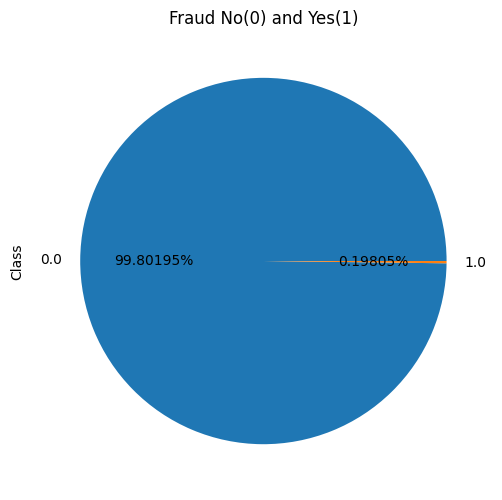

In [8]:
#looking at how many fraud/no fraud cases there are in a pie chart
plt.figure(figsize=(13,7))
plt.subplot(121)
plt.title('Fraud No(0) and Yes(1)')
df["Class"].value_counts().plot.pie(autopct = "%1.5f%%")
plt.show()

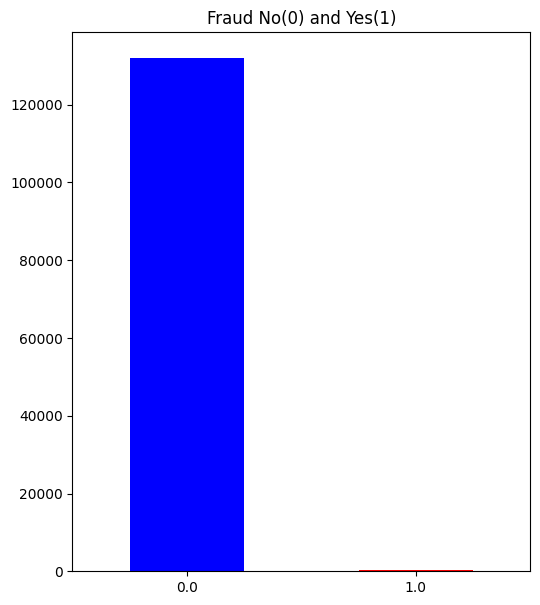

In [9]:
#looking at how many fraud/no fraud cases there are in a bar chart
plt.figure(figsize=(13,7))
plt.subplot(121)
df['Class'].value_counts().plot.bar(color= ['blue','red'], rot=0)
plt.title('Fraud No(0) and Yes(1)')
plt.show()

In [10]:
# looking to see if there are any fraud cases and there are, just not very many. 
print('No Frauds', df['Class'].value_counts()[0], 'num of the dataset')
print('Frauds', df['Class'].value_counts()[1], 'num of the dataset')

No Frauds 132026 num of the dataset
Frauds 262 num of the dataset


In [11]:
#oversampling smaller group
df_no = df[df.Class == 0]
df_yes = df[df.Class == 1]
sample = resample(df_yes, replace=True, n_samples=len(df_no), random_state=123)
sampled_df = pd.concat([df_no, sample])

In [12]:
#verified that it's now equal in number of values in each field.
sampled_df['Class'].value_counts()

0.0    132026
1.0    132026
Name: Class, dtype: int64

Text(0.5, 1.0, 'Heatmap Correlation for Credit Card Fraud')

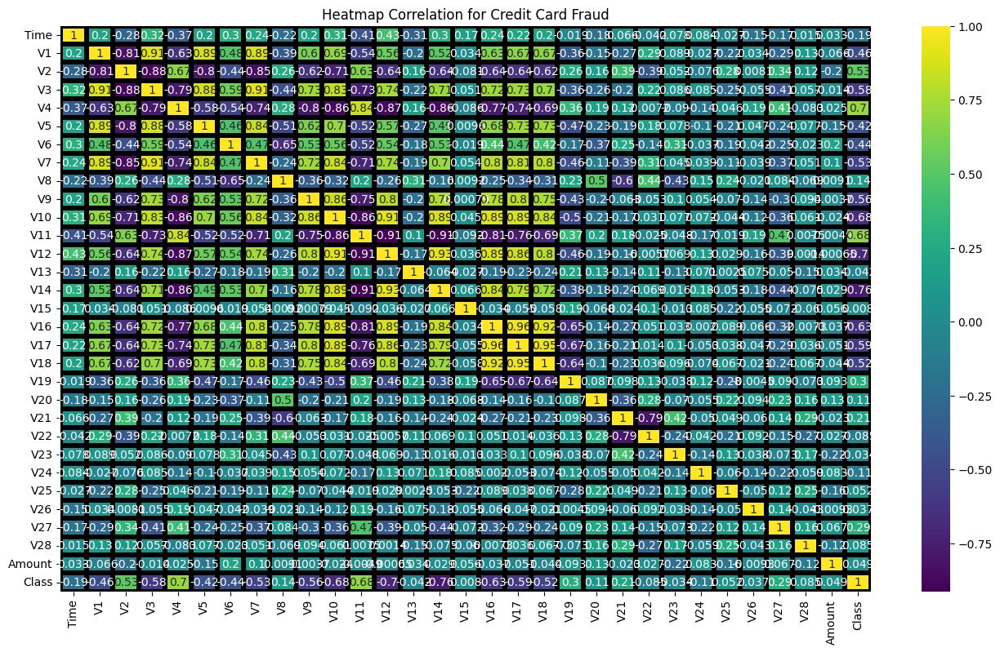

In [13]:
#heatmap
plt.figure(figsize=(16,9))
sns.heatmap(sampled_df.corr(), annot = True, linewidths=4, linecolor='k', cmap='viridis')
plt.title('Heatmap Correlation for Credit Card Fraud')

From the above heatmap, we can see what is most correlated with class are specific credit card descriptors V2, V4, and V11. We currently don't know what these columns mean but the columns can be targeted more in the future for fraud, since they are the biggest indicators. 

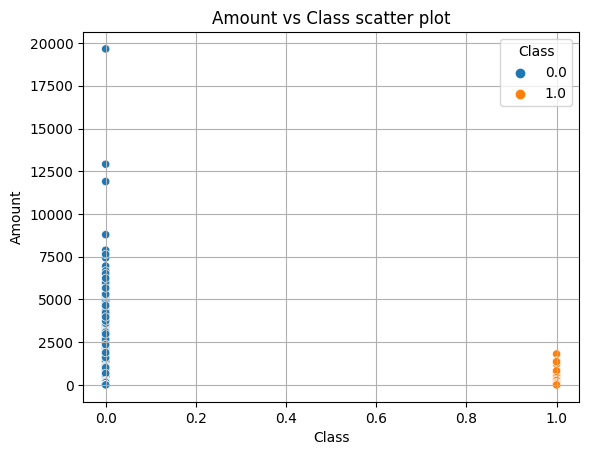

In [14]:
sns.scatterplot(data = df, x = 'Class', y = "Amount", hue = "Class")
plt.title("Amount vs Class scatter plot")
plt.grid()

The above scatter plot shows that most fraud cases are lower money amounts. This makes sense, since most people want to get away with stealing money which is much more easily done with lower amounts that might not get noticied and that the credit card companies will easily approve. 

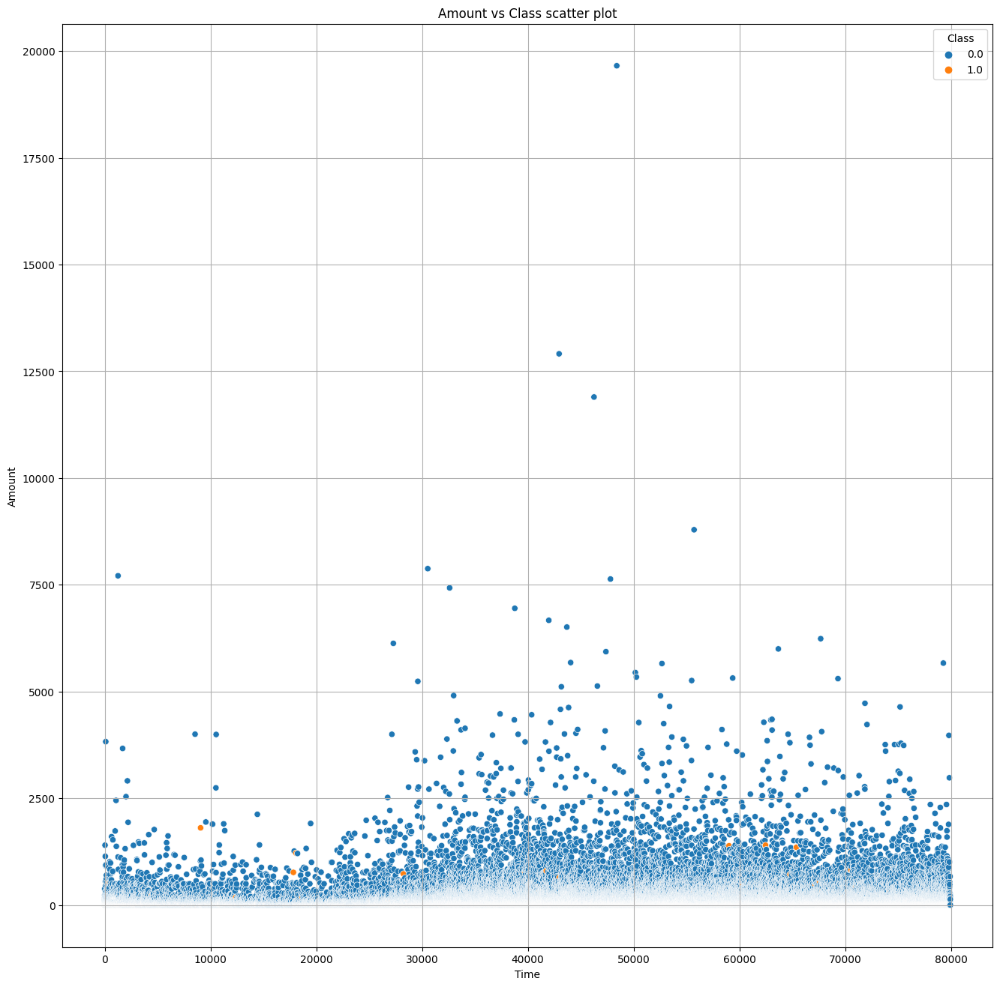

In [79]:
plt.figure(figsize=(16,16))
sns.scatterplot(data = df, x = 'Time', y = "Amount", hue = "Class")
plt.title("Amount vs Class scatter plot")
plt.grid()

Here is a scatterplot with the amount of money and time, with a hue showing if the cases are fraudlent or not. The fraud cases seem to be evenly scattered within the plot. 

In [16]:
#finding outliers
Q1 = sampled_df.quantile(0.25)
Q3 = sampled_df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Time      31379.000000
V1            4.228329
V2            2.916135
V3            5.381035
V4            4.133350
V5            2.623669
V6            1.723926
V7            3.557790
V8            1.060055
V9            2.421293
V10           4.925586
V11           3.808112
V12           6.350854
V13           1.543859
V14           6.917729
V15           1.187817
V16           4.309592
V17           6.540210
V18           2.788332
V19           1.523394
V20           0.609753
V21           0.855717
V22           0.934995
V23           0.373743
V24           0.727049
V25           0.669609
V26           0.638005
V27           0.574220
V28           0.232036
Amount       98.890000
Class         1.000000
dtype: float64


In [17]:
# Removing outliers from dataset
sampled_df = sampled_df[~((sampled_df < (Q1 - 1.5 * IQR)) |(sampled_df > (Q3 + 1.5 * IQR))).any(axis=1)]
sampled_df.shape

(138919, 31)

[None, None, None, None]

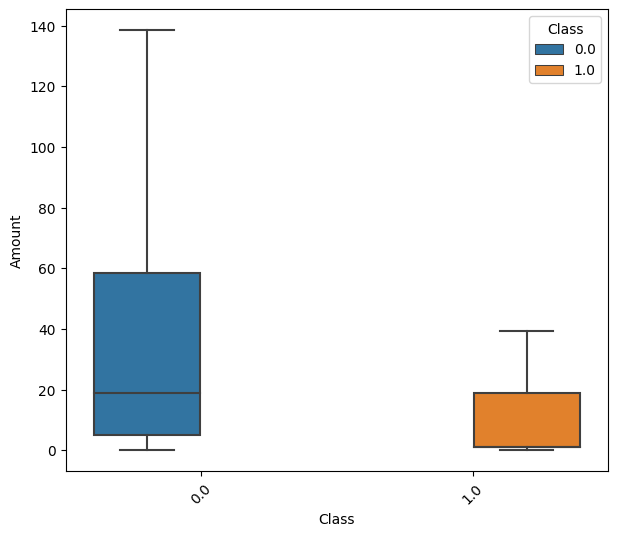

In [18]:
# Box Plot of amount for both classes
plt.figure(figsize = (7, 6))
a=sns.boxplot(x = 'Class', y = 'Amount',hue='Class', data = sampled_df, showfliers=False) 
plt.setp(a.get_xticklabels(), rotation=45)

In [19]:
# boxplot of class/amount using a different type of graph
fig = px.box(sampled_df, x="Class", y="Amount")
fig.show()

<AxesSubplot: title={'center': 'Distribution of Transaction Time'}, ylabel='Density'>

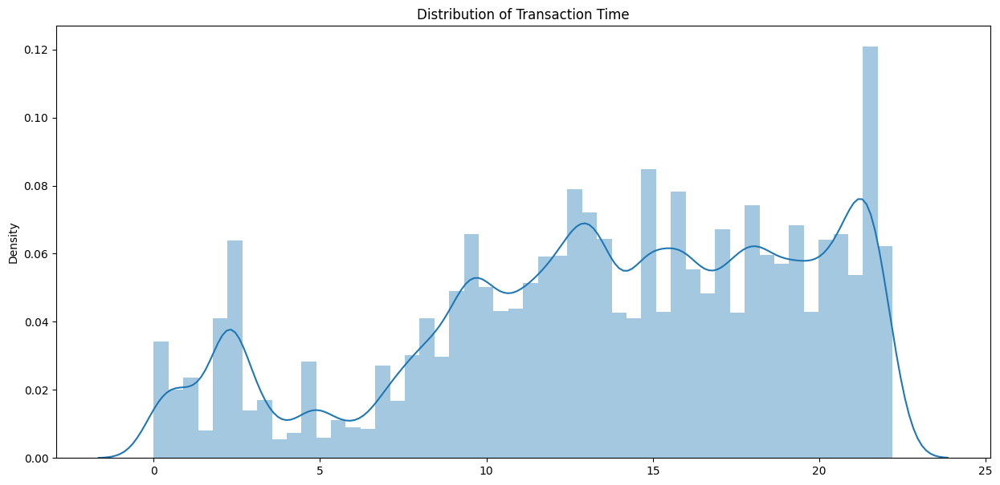

In [20]:
# Time Distribution plot for transactions with the modified sampleset
plt.figure(figsize=(15,7))

plt.title('Distribution of Transaction Time')
sns.distplot(sampled_df['Time'].values/(60*60))

<AxesSubplot: title={'center': 'Distribution of Transaction Time'}, ylabel='Density'>

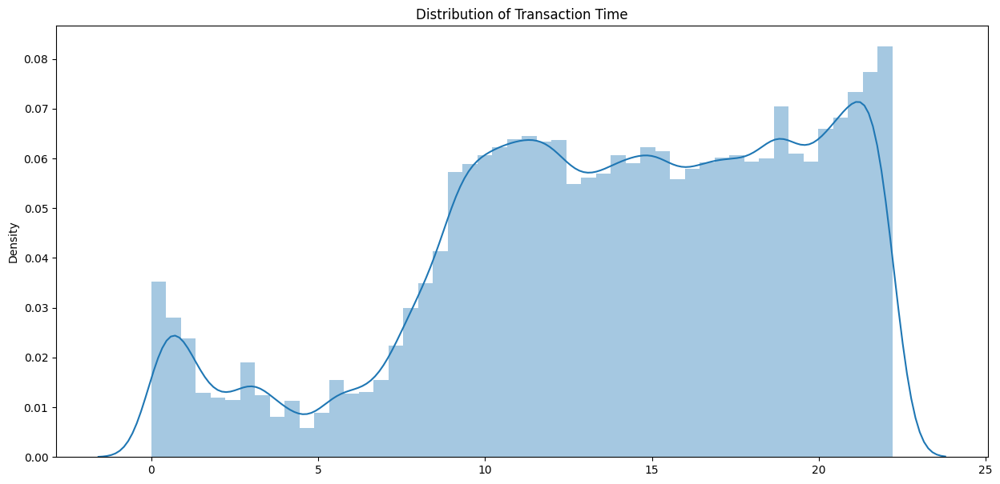

In [21]:
# Time Distribution plot for transactions with the original dataset
plt.figure(figsize=(15,7))

plt.title('Distribution of Transaction Time')
sns.distplot(df['Time'].values/(60*60))

In [22]:
#connecting to sql
conn=sqlite3.connect('mytable.db')

In [23]:
#store dataframe into sql
df.to_sql(name="credit_card",con=conn,if_exists='replace',index=False)
conn.commit()

In [24]:
#connecting to database
%reload_ext sql
%sql sqlite:///mytable.db

In [25]:
#running sql to see if the top amount transactions are frauds, but they're all valid. 
#this code all worked the first time ran but will not run again. 
%%sql

Select Class,Amount from credit_card where Amount>10000

SyntaxError: invalid syntax (19125375.py, line 4)

In [ ]:
#running sql to see only the fraud cases 
%%sql

select Class, Amount from credit_card where Amount<2000 AND Class = '1'

In [33]:
#scale our data
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(sampled_df)
modified_df = pd.DataFrame(r_scaler.transform(sampled_df), index=sampled_df.index, columns=sampled_df.columns)
modified_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.000000,0.682361,0.422738,0.885918,0.532791,0.539180,0.663380,0.796884,0.423414,0.595696,...,0.422137,0.608289,0.479495,0.591002,0.484297,0.411698,0.457831,0.358911,0.602699,0.0
1,0.000000,0.948527,0.455737,0.704844,0.460958,0.580951,0.581096,0.768446,0.420207,0.520514,...,0.361378,0.362658,0.621218,0.434288,0.498721,0.535223,0.394220,0.397465,0.010836,0.0
3,0.000013,0.723411,0.411791,0.829121,0.359661,0.573576,0.781927,0.796707,0.489176,0.383119,...,0.395781,0.535240,0.426057,0.112315,0.678021,0.398831,0.426220,0.447825,0.497482,0.0
4,0.000025,0.703387,0.515280,0.810456,0.457473,0.531958,0.608025,0.828444,0.336303,0.650813,...,0.424736,0.747771,0.461436,0.619641,0.359383,0.682820,0.496149,0.613447,0.281934,0.0
5,0.000025,0.779771,0.523340,0.779312,0.413346,0.618803,0.589046,0.818017,0.461544,0.482481,...,0.366510,0.383789,0.535764,0.422121,0.349382,0.527388,0.511511,0.468970,0.014783,0.0


In [34]:
#splitting up data
x = modified_df.drop(['Class'],axis = 1)
y = modified_df['Class']

In [58]:
#80/20 train/test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [59]:
#classifiying decision tree and fitting it
dtc = DecisionTreeClassifier()
dtc_y = dtc.fit(x_train,y_train)

In [60]:
dtc_pred = dtc_y.predict(x_test)
print('Classification report:\n', classification_report(y_test, dtc_pred))

Classification report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     19576
         1.0       1.00      1.00      1.00      8208

    accuracy                           1.00     27784
   macro avg       1.00      1.00      1.00     27784
weighted avg       1.00      1.00      1.00     27784



In [61]:
#decision tree accuracy score
print('Accuracy Score : ' + str(accuracy_score(y_test,dtc_pred)))
print('ROC AUC : ', roc_auc_score(y_test, dtc_pred))

Accuracy Score : 0.9996760725597467
ROC AUC :  0.9997701266857376


In [62]:
#decision tree confusion matrix
print('Confusion Matrix : \n' + str(confusion_matrix(y_test,dtc_pred)))

Confusion Matrix : 
[[19567     9]
 [    0  8208]]


In [63]:
#classifying random forest tree and fitting it
rfc= RandomForestClassifier(n_jobs=-1, n_estimators = 100, random_state=42, criterion='gini', verbose=False)
rfc_y = rfc.fit(x_train,y_train) 

In [64]:
#random forest classification report
rfc_pred = rfc_y.predict(x_test)
print('Classification report:\n', classification_report(y_test, rfc_pred))

Classification report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     19576
         1.0       1.00      1.00      1.00      8208

    accuracy                           1.00     27784
   macro avg       1.00      1.00      1.00     27784
weighted avg       1.00      1.00      1.00     27784



In [65]:
#random forest accuracy score
print('Accuracy Score : ' + str(accuracy_score(y_test,rfc_pred)))
print('ROC AUC : ', roc_auc_score(y_test, rfc_pred))

Accuracy Score : 0.9999280161243881
ROC AUC :  0.9999489170412751


In [66]:
print('Confusion Matrix : \n' + str(confusion_matrix(y_test,rfc_pred)))

Confusion Matrix : 
[[19574     2]
 [    0  8208]]


In [67]:
#xgb classifier
xgb = XGBClassifier()
xgb_y = xgb.fit(x_train,y_train)

In [68]:
#xgb classification report
xgb_pred = xgb_y.predict(x_test)
print('Classification report:\n', classification_report(y_test, xgb_pred))

Classification report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     19576
         1.0       1.00      1.00      1.00      8208

    accuracy                           1.00     27784
   macro avg       1.00      1.00      1.00     27784
weighted avg       1.00      1.00      1.00     27784



In [69]:
#xgb accuracy score
print('Accuracy Score : ' + str(accuracy_score(y_test,xgb_pred)))
print('ROC AUC : ', roc_auc_score(y_test, xgb_pred))

Accuracy Score : 0.9999280161243881
ROC AUC :  0.9999489170412751


In [70]:
print('Confusion Matrix : \n' + str(confusion_matrix(y_test, xgb_pred)))

Confusion Matrix : 
[[19574     2]
 [    0  8208]]


In [71]:
#logistic regression classifying and fittnig
lr = LogisticRegression()
lr_y = lr.fit(x_train,y_train)

In [72]:
#logisitic regression classification report
lr_pred = lr_y.predict(x_test)
print('Classification report:\n', classification_report(y_test, lr_pred))

Classification report:
               precision    recall  f1-score   support

         0.0       0.94      0.98      0.96     19576
         1.0       0.96      0.86      0.90      8208

    accuracy                           0.95     27784
   macro avg       0.95      0.92      0.93     27784
weighted avg       0.95      0.95      0.95     27784



In [73]:
#logistic regression accuracy score
print('Accuracy Score : ' + str(accuracy_score(y_test,lr_pred)))
print('ROC AUC : ', roc_auc_score(y_test, lr_pred))

Accuracy Score : 0.9464080046069681
ROC AUC :  0.9204034647589322


In [74]:
print('Confusion Matrix : \n' + str(confusion_matrix(y_test,lr_pred)))

Confusion Matrix : 
[[19262   314]
 [ 1175  7033]]


In [75]:
#closing sql connection
conn.close()